## Введение

**Цель проекта**: разработка прототипа модели машинного обучения для «Цифры». Компания разрабатывает решения для эффективной работы промышленных предприятий. Модель должна предсказать коэффициент восстановления золота из золотосодержащей руды. 

**Входные данные** 

Данные с параметрами добычи и очистки: `/datasets/gold_recovery_train.csv`, `/datasets/gold_recovery_test.csv`, `/datasets/gold_recovery_full.csv`


***Признаки***
прописаны в исследовании ниже

##### Дополнительные условия
- Необходимо смоделировать процесс восстановления золота из золотосодержащей руды.
- Метрика качества: Итоговое sMAPE

# Просмотр и предобработка первичных данных

## Предобработка данных

In [1]:
# Импортируем библиотеки, которые нам понадобятся в дальнейшем:
import pandas as pd
import numpy as np
import datetime as dt
import math
import matplotlib.pyplot as plt
from scipy import stats as st
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
from IPython.core.display import HTML
from datetime import datetime, timedelta
from sklearn.pipeline import Pipeline



# sklearn
from sklearn.model_selection import train_test_split, cross_validate, GridSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, make_scorer
from sklearn.preprocessing import StandardScaler 
from sklearn.utils import shuffle
from sklearn.compose import ColumnTransformer
from sklearn.multioutput import MultiOutputRegressor

Рассмотрим основную информацию по полученным датасетам: общий вид и тип данных, названия столбцов, количество пропусков и полных дубликатов.

In [2]:
gold_recovery_train = pd.read_csv('/datasets/gold_recovery_train.csv')
gold_recovery_test = pd.read_csv('/datasets/gold_recovery_test.csv')
gold_recovery_full = pd.read_csv('/datasets/gold_recovery_full.csv')

pd.options.display.max_rows=86
# Функция для беглого осмотра данных:
def info(name, data):
    print(name)
    print()
    data.info()
    print()
    print(data.columns)
    print()
    display(data.head())
    print()
    print('Количество пропусков:')
    print(data.isna().sum())
    print()
    print('Количество дубликатов:', data.duplicated().sum())
    
info('gold_recovery_train', gold_recovery_train)
info('gold_recovery_test', gold_recovery_test)
info('gold_recovery_full', gold_recovery_full)

gold_recovery_train

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16860 entries, 0 to 16859
Data columns (total 87 columns):
date                                                  16860 non-null object
final.output.concentrate_ag                           16788 non-null float64
final.output.concentrate_pb                           16788 non-null float64
final.output.concentrate_sol                          16490 non-null float64
final.output.concentrate_au                           16789 non-null float64
final.output.recovery                                 15339 non-null float64
final.output.tail_ag                                  16794 non-null float64
final.output.tail_pb                                  16677 non-null float64
final.output.tail_sol                                 16715 non-null float64
final.output.tail_au                                  16794 non-null float64
primary_cleaner.input.sulfate                         15553 non-null float64
primary_cleaner.input.de

,date,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
0,2016-01-15 00:00:00,6.055403,9.889648,5.507324,42.192020,70.541216,10.411962,0.895447,16.904297,2.143149,...,14.016835,-502.488007,12.099931,-504.715942,9.925633,-498.310211,8.079666,-500.470978,14.151341,-605.841980
1,2016-01-15 01:00:00,6.029369,9.968944,5.257781,42.701629,69.266198,10.462676,0.927452,16.634514,2.224930,...,13.992281,-505.503262,11.950531,-501.331529,10.039245,-500.169983,7.984757,-500.582168,13.998353,-599.787184
2,2016-01-15 02:00:00,6.055926,10.213995,5.383759,42.657501,68.116445,10.507046,0.953716,16.208849,2.257889,...,14.015015,-502.520901,11.912783,-501.133383,10.070913,-500.129135,8.013877,-500.517572,14.028663,-601.427363
3,2016-01-15 03:00:00,6.047977,9.977019,4.858634,42.689819,68.347543,10.422762,0.883763,16.532835,2.146849,...,14.036510,-500.857308,11.999550,-501.193686,9.970366,-499.201640,7.977324,-500.255908,14.005551,-599.996129
4,2016-01-15 04:00:00,6.148599,10.142511,4.939416,42.774141,66.927016,10.360302,0.792826,16.525686,2.055292,...,14.027298,-499.838632,11.953070,-501.053894,9.925709,-501.686727,7.894242,-500.356035,13.996647,-601.496691



Количество пропусков:
date                                            0
final.output.concentrate_ag                    72
final.output.concentrate_pb                    72
final.output.concentrate_sol                  370
final.output.concentrate_au                    71
                                             ... 
secondary_cleaner.state.floatbank5_a_level     85
secondary_cleaner.state.floatbank5_b_air       85
secondary_cleaner.state.floatbank5_b_level     84
secondary_cleaner.state.floatbank6_a_air      103
secondary_cleaner.state.floatbank6_a_level     85
Length: 87, dtype: int64

Количество дубликатов: 0
gold_recovery_test

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5856 entries, 0 to 5855
Data columns (total 53 columns):
date                                          5856 non-null object
primary_cleaner.input.sulfate                 5554 non-null float64
primary_cleaner.input.depressant              5572 non-null float64
primary_cleaner.input.feed_size               

,date,primary_cleaner.input.sulfate,primary_cleaner.input.depressant,primary_cleaner.input.feed_size,primary_cleaner.input.xanthate,primary_cleaner.state.floatbank8_a_air,primary_cleaner.state.floatbank8_a_level,primary_cleaner.state.floatbank8_b_air,primary_cleaner.state.floatbank8_b_level,primary_cleaner.state.floatbank8_c_air,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
0,2016-09-01 00:59:59,210.800909,14.993118,8.080000,1.005021,1398.981301,-500.225577,1399.144926,-499.919735,1400.102998,...,12.023554,-497.795834,8.016656,-501.289139,7.946562,-432.317850,4.872511,-500.037437,26.705889,-499.709414
1,2016-09-01 01:59:59,215.392455,14.987471,8.080000,0.990469,1398.777912,-500.057435,1398.055362,-499.778182,1396.151033,...,12.058140,-498.695773,8.130979,-499.634209,7.958270,-525.839648,4.878850,-500.162375,25.019940,-499.819438
2,2016-09-01 02:59:59,215.259946,12.884934,7.786667,0.996043,1398.493666,-500.868360,1398.860436,-499.764529,1398.075709,...,11.962366,-498.767484,8.096893,-500.827423,8.071056,-500.801673,4.905125,-499.828510,24.994862,-500.622559
3,2016-09-01 03:59:59,215.336236,12.006805,7.640000,0.863514,1399.618111,-498.863574,1397.440120,-499.211024,1400.129303,...,12.033091,-498.350935,8.074946,-499.474407,7.897085,-500.868509,4.931400,-499.963623,24.948919,-498.709987
4,2016-09-01 04:59:59,199.099327,10.682530,7.530000,0.805575,1401.268123,-500.808305,1398.128818,-499.504543,1402.172226,...,12.025367,-500.786497,8.054678,-500.397500,8.107890,-509.526725,4.957674,-500.360026,25.003331,-500.856333



Количество пропусков:
date                                            0
primary_cleaner.input.sulfate                 302
primary_cleaner.input.depressant              284
primary_cleaner.input.feed_size                 0
primary_cleaner.input.xanthate                166
primary_cleaner.state.floatbank8_a_air         16
primary_cleaner.state.floatbank8_a_level       16
primary_cleaner.state.floatbank8_b_air         16
primary_cleaner.state.floatbank8_b_level       16
primary_cleaner.state.floatbank8_c_air         16
primary_cleaner.state.floatbank8_c_level       16
primary_cleaner.state.floatbank8_d_air         16
primary_cleaner.state.floatbank8_d_level       16
rougher.input.feed_ag                          16
rougher.input.feed_pb                          16
rougher.input.feed_rate                        40
rougher.input.feed_size                        22
rougher.input.feed_sol                         67
rougher.input.feed_au                          16
rougher.input.floatbank10_s

,date,final.output.concentrate_ag,final.output.concentrate_pb,final.output.concentrate_sol,final.output.concentrate_au,final.output.recovery,final.output.tail_ag,final.output.tail_pb,final.output.tail_sol,final.output.tail_au,...,secondary_cleaner.state.floatbank4_a_air,secondary_cleaner.state.floatbank4_a_level,secondary_cleaner.state.floatbank4_b_air,secondary_cleaner.state.floatbank4_b_level,secondary_cleaner.state.floatbank5_a_air,secondary_cleaner.state.floatbank5_a_level,secondary_cleaner.state.floatbank5_b_air,secondary_cleaner.state.floatbank5_b_level,secondary_cleaner.state.floatbank6_a_air,secondary_cleaner.state.floatbank6_a_level
0,2016-01-15 00:00:00,6.055403,9.889648,5.507324,42.192020,70.541216,10.411962,0.895447,16.904297,2.143149,...,14.016835,-502.488007,12.099931,-504.715942,9.925633,-498.310211,8.079666,-500.470978,14.151341,-605.841980
1,2016-01-15 01:00:00,6.029369,9.968944,5.257781,42.701629,69.266198,10.462676,0.927452,16.634514,2.224930,...,13.992281,-505.503262,11.950531,-501.331529,10.039245,-500.169983,7.984757,-500.582168,13.998353,-599.787184
2,2016-01-15 02:00:00,6.055926,10.213995,5.383759,42.657501,68.116445,10.507046,0.953716,16.208849,2.257889,...,14.015015,-502.520901,11.912783,-501.133383,10.070913,-500.129135,8.013877,-500.517572,14.028663,-601.427363
3,2016-01-15 03:00:00,6.047977,9.977019,4.858634,42.689819,68.347543,10.422762,0.883763,16.532835,2.146849,...,14.036510,-500.857308,11.999550,-501.193686,9.970366,-499.201640,7.977324,-500.255908,14.005551,-599.996129
4,2016-01-15 04:00:00,6.148599,10.142511,4.939416,42.774141,66.927016,10.360302,0.792826,16.525686,2.055292,...,14.027298,-499.838632,11.953070,-501.053894,9.925709,-501.686727,7.894242,-500.356035,13.996647,-601.496691



Количество пропусков:
date                                            0
final.output.concentrate_ag                    89
final.output.concentrate_pb                    87
final.output.concentrate_sol                  385
final.output.concentrate_au                    86
                                             ... 
secondary_cleaner.state.floatbank5_a_level    101
secondary_cleaner.state.floatbank5_b_air      101
secondary_cleaner.state.floatbank5_b_level    100
secondary_cleaner.state.floatbank6_a_air      119
secondary_cleaner.state.floatbank6_a_level    101
Length: 87, dtype: int64

Количество дубликатов: 0


Мы видим, что названия столбцов отражают технологические этапы, однако расположены они в алфавитном порядке, а не в соответствии с производственным процессом. Для понимания процесса, будет логичным выстроить логическую последовательность этапов с привязкой к показателям.  

Тестовая выборка состоит из 53 показателей, против 87 в обучающей и полной. Поскольку условиями задачи оговаривалось, что полная выборка включает обучающую и тестовой (подсчет количества строк в пользу этого утверждения), предположим, что можно будет из нее при необходимости восстановить недостающие данные. 

В каждой выборке имеются пропущенные значения. Имеет смысл проверить, можно ли их восстановить из данных других выборок, а если нет - то условиями также проговаривалось, что близкие по дате показатели обладают схожими значенями. 

Полные дубликаты отсутствуют. 

Поскольку данные индексируются датой и временем получения информации, установим столбец *date* в качестве индексного.

In [3]:
# Переведем тип данных в формат datetime:
gold_recovery_train['date'] = pd.to_datetime(gold_recovery_train['date'], format='%Y-%m-%d %H:%M:%S')
gold_recovery_test['date'] = pd.to_datetime(gold_recovery_test['date'], format='%Y-%m-%d %H:%M:%S')
gold_recovery_full['date'] = pd.to_datetime(gold_recovery_full['date'], format='%Y-%m-%d %H:%M:%S')

In [4]:
# Установим в качестве индексов значения столбца 'date':
gold_recovery_train.index = gold_recovery_train['date']
gold_recovery_test.index = gold_recovery_test['date']
gold_recovery_full.index = gold_recovery_full['date']

# После этого исключим столбец 'date' за ненадобностью:
def drop_columns(data, columns):
    data = data.drop(columns, axis=1)
    return data

gold_recovery_train = drop_columns(gold_recovery_train, 'date')
gold_recovery_test = drop_columns(gold_recovery_test, 'date')
gold_recovery_full = drop_columns(gold_recovery_full, 'date')

Проверим, соответствует ли действительности утверждение о том, что данные датафрейма `full` состоят из `test` и `train`. По количеству строк они совпали, проверим их на идентичность данных в соответствии с индексами:

In [5]:
# Сравнение соответствия суммы индексов из test и train c индексами full:
print(pd.Series(gold_recovery_train.index).append(pd.Series(gold_recovery_test.index)).
      sort_values(inplace=True) == pd.Series(gold_recovery_full.index).sort_values(inplace=True))

# Cравним соответствие данных в полной выборке и обучающей.
compare_train = gold_recovery_train == gold_recovery_full.loc[gold_recovery_train.index]


display(compare_train.sum().sort_values()-16860)

True


rougher.output.tail_ag                               -3293
rougher.output.tail_au                               -3099
rougher.input.floatbank11_xanthate                   -2980
rougher.output.recovery                              -2594
rougher.calculation.au_pb_ratio                      -2536
secondary_cleaner.output.tail_sol                    -2502
rougher.output.tail_sol                              -2428
primary_cleaner.input.depressant                     -1835
rougher.input.feed_pb                                -1657
final.output.tail_au                                 -1575
final.output.recovery                                -1539
primary_cleaner.output.tail_au                       -1478
rougher.input.floatbank10_xanthate                   -1465
primary_cleaner.input.sulfate                        -1427
final.output.tail_pb                                 -1425
primary_cleaner.output.tail_pb                       -1402
primary_cleaner.input.feed_size                      -13

Мы видим, что время и дата самих наблюдений по обучающей и тестовой выборкам соответствует наблюдениям общей выборки, однако при сравнении в самих данных между общей и обучающей выборками мы видим расхождения, которые в зависимости от показателя составляют от 0.6% до 19,5%.  
Проверим характер этих расхождений на некоторых примерах.

In [6]:
print(gold_recovery_train.loc['2018-08-18 08:59:59', 'final.output.concentrate_pb'])
print(gold_recovery_full.loc['2018-08-18 08:59:59', 'final.output.concentrate_pb'])

print(gold_recovery_train.loc['2018-08-18 08:59:59', 'secondary_cleaner.state.floatbank5_a_level'])
print(gold_recovery_full.loc['2018-08-18 08:59:59', 'secondary_cleaner.state.floatbank5_a_level'])

11.434365993605724
11.434365993605725
-500.45115602742396
-500.451156027424


Вероятно, расхождения в данных обусловлены округлениями. Попробуем округлить до 6 знака после запятой и сравним еще раз.

In [7]:
compare_train_round = (
    gold_recovery_train.round(6) == gold_recovery_full.loc[gold_recovery_train.index].round(6)
)
display(compare_train_round.sum().sort_values()-16860)

rougher.output.recovery                              -2573
rougher.output.tail_ag                               -2250
rougher.output.tail_au                               -2249
rougher.output.tail_sol                              -2249
secondary_cleaner.output.tail_sol                    -1986
rougher.input.floatbank11_xanthate                   -1904
final.output.recovery                                -1521
primary_cleaner.input.sulfate                        -1307
primary_cleaner.input.depressant                     -1262
rougher.calculation.au_pb_ratio                      -1242
rougher.input.floatbank10_sulfate                    -1044
primary_cleaner.input.xanthate                        -985
primary_cleaner.output.concentrate_sol                -636
rougher.input.floatbank11_sulfate                     -623
rougher.state.floatbank10_e_air                       -603
rougher.input.feed_rate                               -513
rougher.input.feed_size                               -4

Округление несколько улучшило ситуацию, так что при возможности, имеет смысл обговорить данные расхождения с заказчиком и понять, какие из них являются истинными. Однако ввиду отсутствия такой возможности, и исходя из условия задачи, примем значения в обучающей выборки истинными для проведения анализа.

___

Попробуем заменить отсутствующие данные из обучающей выборки данными из полной. 

In [9]:
first_iter = gold_recovery_train.isna().sum()

for i in gold_recovery_train.index:
    for j in gold_recovery_train.columns:
        if np.isnan(gold_recovery_train.loc[i, j]):
            gold_recovery_train.loc[i, j] = gold_recovery_full.loc[i, j]  
            
second_iter = gold_recovery_train.isna().sum()

print(second_iter - first_iter)

final.output.concentrate_ag                           0
final.output.concentrate_pb                           0
final.output.concentrate_sol                          0
final.output.concentrate_au                           0
final.output.recovery                                 0
final.output.tail_ag                                  0
final.output.tail_pb                                  0
final.output.tail_sol                                 0
final.output.tail_au                                  0
primary_cleaner.input.sulfate                         0
primary_cleaner.input.depressant                      0
primary_cleaner.input.feed_size                       0
primary_cleaner.input.xanthate                        0
primary_cleaner.output.concentrate_ag                 0
primary_cleaner.output.concentrate_pb                 0
primary_cleaner.output.concentrate_sol                0
primary_cleaner.output.concentrate_au                 0
primary_cleaner.output.tail_ag                  

Мы видим, что пропуски из обучающей выборки соответствуют пропускам из полной. 

В связи с этим, для заполнения пропусков воспользуемся отраженной в условиях информацией о том, что близкие по времени наблюдения зачастую очень похожи: заменим пропуски предшествующими значениями.

In [10]:
for i in range(len(gold_recovery_train.index)):
    for j in gold_recovery_train.columns:
        if np.isnan(gold_recovery_train.loc[gold_recovery_train.index[i], j]):
            gold_recovery_train.loc[gold_recovery_train.index[i], j] = \
            gold_recovery_train.loc[gold_recovery_train.index[i-1], j]  

third_iter = gold_recovery_train.isna().sum()            
print(third_iter)

final.output.concentrate_ag                           0
final.output.concentrate_pb                           0
final.output.concentrate_sol                          0
final.output.concentrate_au                           0
final.output.recovery                                 0
final.output.tail_ag                                  0
final.output.tail_pb                                  0
final.output.tail_sol                                 0
final.output.tail_au                                  0
primary_cleaner.input.sulfate                         0
primary_cleaner.input.depressant                      0
primary_cleaner.input.feed_size                       0
primary_cleaner.input.xanthate                        0
primary_cleaner.output.concentrate_ag                 0
primary_cleaner.output.concentrate_pb                 0
primary_cleaner.output.concentrate_sol                0
primary_cleaner.output.concentrate_au                 0
primary_cleaner.output.tail_ag                  

In [11]:
print(gold_recovery_test.isna().sum())
for i in range(len(gold_recovery_test.index)):
    for j in gold_recovery_test.columns:
        if np.isnan(gold_recovery_test.loc[gold_recovery_test.index[i], j]):
            gold_recovery_test.loc[gold_recovery_test.index[i], j] = \
            gold_recovery_test.loc[gold_recovery_test.index[i-1], j]  

print(gold_recovery_test.isna().sum())

primary_cleaner.input.sulfate                 302
primary_cleaner.input.depressant              284
primary_cleaner.input.feed_size                 0
primary_cleaner.input.xanthate                166
primary_cleaner.state.floatbank8_a_air         16
primary_cleaner.state.floatbank8_a_level       16
primary_cleaner.state.floatbank8_b_air         16
primary_cleaner.state.floatbank8_b_level       16
primary_cleaner.state.floatbank8_c_air         16
primary_cleaner.state.floatbank8_c_level       16
primary_cleaner.state.floatbank8_d_air         16
primary_cleaner.state.floatbank8_d_level       16
rougher.input.feed_ag                          16
rougher.input.feed_pb                          16
rougher.input.feed_rate                        40
rougher.input.feed_size                        22
rougher.input.feed_sol                         67
rougher.input.feed_au                          16
rougher.input.floatbank10_sulfate             257
rougher.input.floatbank10_xanthate            123


**Вывод**  

Проведена предобработка данных, заполнены пропущенные значения, дата и время наблюдений вынесены в индексы. Теперь мы можем структурировать технологический процесс и провести предварительный анализ целевого признака.

## Предварительный анализ целевого показателя

Соотнесем представленные признаки в соответствии со схемой технологического процесса:

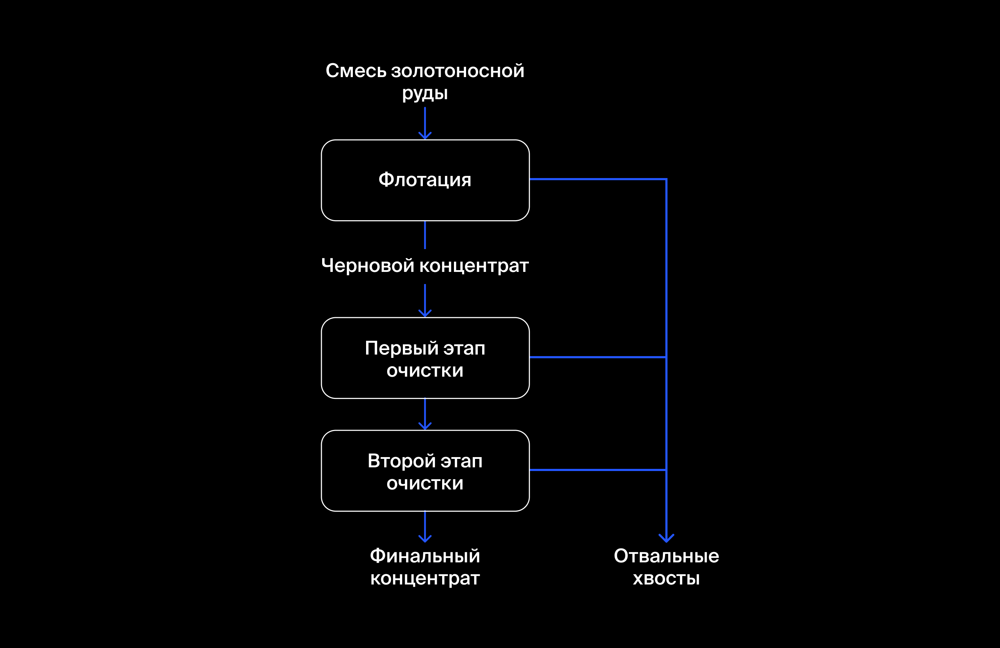  

***Входное сырье:***
- `rougher.input.feed_ag` 
- `rougher.input.feed_pb`
- `rougher.input.feed_sol`
- `rougher.input.feed_au`
- `rougher.input.feed_rate`
- `rougher.input.feed_size`
- `rougher.input.floatbank10_sulfate`
- `rougher.input.floatbank10_xanthate`
- `rougher.input.floatbank11_sulfate`
- `rougher.input.floatbank11_xanthate`  

***Флотация:***
**параметры текущего состояния этапа**
- `rougher.state.floatbank10_a_air`
- `rougher.state.floatbank10_a_level`
- `rougher.state.floatbank10_b_air`
- `rougher.state.floatbank10_b_level`
- `rougher.state.floatbank10_c_air`
- `rougher.state.floatbank10_c_level`
- `rougher.state.floatbank10_d_air`
- `rougher.state.floatbank10_d_level`
- `rougher.state.floatbank10_e_air`
- `rougher.state.floatbank10_e_level`
- `rougher.state.floatbank10_f_air`
- `rougher.state.floatbank10_f_level`

**расчетные характеристики**  
- `rougher.calculation.sulfate_to_au_concentrate`
- `rougher.calculation.floatbank10_sulfate_to_au_feed`
- `rougher.calculation.floatbank11_sulfate_to_au_feed`
- `rougher.calculation.au_pb_ratio`

**отвальные хвосты на этапе флотации**
- `rougher.output.tail_ag`
- `rougher.output.tail_pb`
- `rougher.output.tail_sol`
- `rougher.output.tail_au`

***Параметры чернового концентрата:***
- `rougher.output.concentrate_ag`
- `rougher.output.concentrate_pb`
- `rougher.output.concentrate_sol`
- `rougher.output.concentrate_au`
- `rougher.output.recovery` ***(целевой признак)***


***Первый этап очистки:***
**входные параметры**
- `primary_cleaner.input.sulfate`
- `primary_cleaner.input.depressant`
- `primary_cleaner.input.feed_size`
- `primary_cleaner.input.xanthate`
  
  
**параметры текущего состояния этапа**
- `primary_cleaner.state.floatbank8_a_air`
- `primary_cleaner.state.floatbank8_a_level`
- `primary_cleaner.state.floatbank8_b_air`
- `primary_cleaner.state.floatbank8_b_level`
- `primary_cleaner.state.floatbank8_c_air`
- `primary_cleaner.state.floatbank8_c_level`
- `primary_cleaner.state.floatbank8_d_air`
- `primary_cleaner.state.floatbank8_d_level`

**отвальные хвосты на первом этапе**
- `primary_cleaner.output.tail_ag`
- `primary_cleaner.output.tail_pb`
- `primary_cleaner.output.tail_sol`
- `primary_cleaner.output.tail_au`

***Параметры продукта после первого этапа очистки:***
- `primary_cleaner.output.concentrate_ag`
- `primary_cleaner.output.concentrate_pb`
- `primary_cleaner.output.concentrate_sol`
- `primary_cleaner.output.concentrate_au`

***Второй этап очистки:***
**параметры текущего состояния этапа**
- `secondary_cleaner.state.floatbank2_a_air`
- `secondary_cleaner.state.floatbank2_a_level`
- `secondary_cleaner.state.floatbank2_b_air`
- `secondary_cleaner.state.floatbank2_b_level`
- `secondary_cleaner.state.floatbank3_a_air`
- `secondary_cleaner.state.floatbank3_a_level`
- `secondary_cleaner.state.floatbank3_b_air`
- `secondary_cleaner.state.floatbank3_b_level`
- `secondary_cleaner.state.floatbank4_a_air`
- `secondary_cleaner.state.floatbank4_a_level`
- `secondary_cleaner.state.floatbank4_b_air`
- `secondary_cleaner.state.floatbank4_b_level`
- `secondary_cleaner.state.floatbank5_a_air`
- `secondary_cleaner.state.floatbank5_a_level`
- `secondary_cleaner.state.floatbank5_b_air`
- `secondary_cleaner.state.floatbank5_b_level`
- `secondary_cleaner.state.floatbank6_a_air`
- `secondary_cleaner.state.floatbank6_a_level`

**отвальные хвосты на втором этапе**
- `secondary_cleaner.output.tail_ag`
- `secondary_cleaner.output.tail_pb`
- `secondary_cleaner.output.tail_sol`
- `secondary_cleaner.output.tail_au`

***Финальный концентрат***
**параметры финального продукта**
- `final.output.concentrate_ag`
- `final.output.concentrate_pb`
- `final.output.concentrate_sol`
- `final.output.concentrate_au`
- `final.output.recovery` ***(целевой признак)***

**отвальные хвосты на финальном этапе**
- `final.output.tail_ag`
- `final.output.tail_pb`
- `final.output.tail_sol`
- `final.output.tail_au`



Проверим, что эффективность обогащения рассчитана правильно. Вычислите её на обучающей выборке для признака `rougher.output.recovery`. 

Показатель эффективности обогащения рассчитывается по формуле:

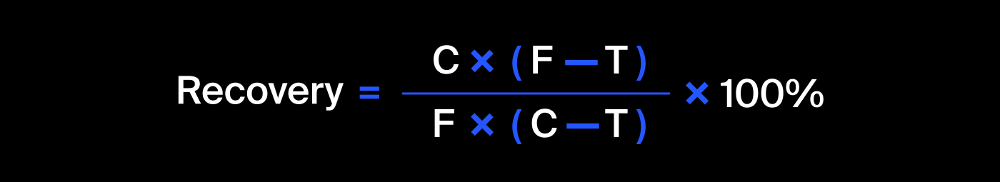

где:
- C — доля золота в концентрате после флотации/очистки;
- F — доля золота в сырье/концентрате до флотации/очистки;
- T — доля золота в отвальных хвостах после флотации/очистки.

Для этапа флотации, показатель `rougher.output.recovery` будет рассчитываться следующим образом:

In [12]:
c_tr_r = gold_recovery_train['rougher.output.concentrate_au'] #доля Au в концентрате после флотации
f_tr_r = gold_recovery_train['rougher.input.feed_au'] #доля Au в исходном сырье
t_tr_r = gold_recovery_train['rougher.output.tail_au'] #доля золота в отвальных хвостах после флотации

rougher_recovery = (c_tr_r * (f_tr_r - t_tr_r)) / (f_tr_r * (c_tr_r - t_tr_r)) * 100

Для рассчета показателя MAE избавимся от пропущенных значений, и бесконечныз значений, вызванных делением на 0.

In [13]:
# Удалим пропуски и значения с бесконечностью
display(rougher_recovery.value_counts())
rougher_recovery = rougher_recovery[(0 <= rougher_recovery) & (rougher_recovery <= 100)]

-0.000000      378
 100.000000    359
-inf            42
 93.323865      22
 83.406924      10
              ... 
 86.625307       1
 95.128746       1
 68.292951       1
 87.559084       1
 83.437194       1
Length: 14863, dtype: int64

In [14]:
# Рассчитаем показатель MAE:
print('MAE: {:.4f}%'.format(mean_absolute_error(gold_recovery_train['rougher.output.recovery'].
                                              loc[rougher_recovery.index], rougher_recovery)))

MAE: 1.0116%


Рассчитанная средняя абсолютная ошибка составляет ~1%. Другими словами, наш расчет отличается от данных целевого признака на +-1%. Имеет смысл уточнить у бизнеса, в чем может быть причина расхождений и насколько размер данной ошибки критичен.  

Ввиду отсутствия такой информации, примем, что данная ошибка находится в допустимых пределах.

----

При рассмотрении тестового датасета мы видим, что количество признаков значительно меньше, чем в обучающем. Итого 52 признака, из которого 2 являются целевыми. 

При просмотре показателей мы видим, что отсутствуют параметры продукта (`.output.`), в том числе целевые, а также расчетные характеристики (`.calculation.`), т.е. те показатели, которые выводятся из предшествующих и отсутствуют на начальном этапе.

Отсутствующие данные целевых признаков в тестовой выборке будет возможно взять из полной выборки по соответствующим индексам, на стадии подготовки входных данных для обучения модели.

**Вывод**  

На данном этапе мы проверили данные, выявили логику расчета показателей, заполнили пропуски. Датасеты готовы для проведения дальнейшего анализа.

# Анализ данных

## Анализ изменения концентрации металлов на разных этапах очистки

Рассмотрим, как меняется концентрация металлов (золота, свинца и серебра) на каждом этапе очистки. Вынесем соответствующие показатели по каждому металлу и оценим распределение с помощью метода describe() и построения диаграммы размаха.

In [15]:
# Составим функцию для вывода вшфграмм размаха:
def boxplot_info(data, columns):
    fig = go.Figure()
    fig.add_trace(go.Box(y=data[columns[0]], name=columns[0]))
    fig.add_trace(go.Box(y=data[columns[1]], name=columns[1]))
    fig.add_trace(go.Box(y=data[columns[2]], name=columns[2]))
    fig.show()

# Функция для вывода информации по столбцам:
def describe(data, columns):
    d0= data[columns[0]].describe()
    d1= data[columns[1]].describe()
    d2= data[columns[2]].describe()
    return pd.concat([d0, d1, d2], axis=1)

columns_ag = ['rougher.output.concentrate_ag', 
               'primary_cleaner.output.concentrate_ag', 
               'final.output.concentrate_ag']
columns_pb = ['rougher.output.concentrate_pb', 
               'primary_cleaner.output.concentrate_pb', 
               'final.output.concentrate_pb']
columns_au = ['rougher.output.concentrate_au', 
               'primary_cleaner.output.concentrate_au', 
               'final.output.concentrate_au']

- концентрация серебра:

In [16]:
boxplot_info(gold_recovery_train, columns_ag)   
display(describe(gold_recovery_train, columns_ag))

,rougher.output.concentrate_ag,primary_cleaner.output.concentrate_ag,final.output.concentrate_ag
count,16860.000000,16860.000000,16860.000000
mean,10.541930,7.390585,4.699066
std,4.486629,3.135757,2.111997
min,0.000000,0.000000,0.000000
25%,9.953223,6.592263,3.958988
50%,11.444529,7.985558,4.860663
75%,13.267408,9.393336,5.816487
max,24.480271,16.081632,16.001945


Мы видим, что концентрация серебра с каждым этапом производственного процесса снижается: среднее значение опускается с *10.54* до *4.7*. Медианные значения близки к средним, что может свидетельствовать о распределении, близком к нормальному. Максимальная концентрация может достигать на первом этапе *~24.5*, и *~16* на последующих. Примечательно, что по итогам первичной и вторичной очистки максимальная концентрация не меняется, в то время как наблюдения, попадающие в интервал с 1 по 3 квартили снижаются почти в 2 раза.

- концентрация свинца:

In [17]:
boxplot_info(gold_recovery_train, columns_pb)  
display(describe(gold_recovery_train, columns_pb))  

,rougher.output.concentrate_pb,primary_cleaner.output.concentrate_pb,final.output.concentrate_pb
count,16860.000000,16860.000000,16860.000000
mean,6.861249,8.493673,9.080638
std,2.959401,3.909885,3.428085
min,0.000000,0.000000,0.000000
25%,6.331015,6.918728,8.803975
50%,7.578584,9.556796,10.059206
75%,8.501206,11.100156,11.052001
max,18.394042,17.081278,17.031899


Мы видим противоположную картину: концентрация свинца с каждым этапом производственного процесса растет, среднее значение выросло с *6.86* до *9.08*. Медианные значения также достаточно близки к средним, однако все же выше, что свидетельствует о смещении распределения в сторону более низких значений. Максимальная концентрация на всех этапах находится в интервале *17.0 - 18.4*.  

- концентрация золота:

In [18]:
boxplot_info(gold_recovery_train, columns_au)  
display(describe(gold_recovery_train, columns_au))

,rougher.output.concentrate_au,primary_cleaner.output.concentrate_au,final.output.concentrate_au
count,16860.000000,16860.000000,16860.000000
mean,17.337662,29.041786,39.321631
std,6.985496,11.124170,14.095421
min,0.000000,0.000000,0.000000
25%,17.400564,29.581985,42.003201
50%,19.631078,32.630490,44.484966
75%,21.219480,35.004503,45.969495
max,28.522811,45.933934,53.611374


Концентрация золота с каждым этапом производственного процесса также растет, среднее значение увеличивается с *17.3* до *39.3*. Медианные значения выше средних, что свидетельствует о смещении распределения в сторону более низких значений. 
Видно больше количество выбросов, лежащих за пределами нижнего "уса" диаграммы размаха.  
Максимальная концентрация ведет себя также как и среднее значение: наблюдается рост показателя с *28.5* до *53.6*

В целом повышение концентрации необходимого продукта логично, собственно для  этого и осуществляется процесс флотации и очистки. 

## Анализ распределения гранул сырья

Сравним распределения гранул сырья на обучающей и тестовой выборках. Сравним гистограммы показателей `rougher.input.feed_size` и `primary_cleaner.input.feed_size`

In [19]:
# Функция дл вывода гистограммы:
def histogramm (data1, data2, column, b, range1, range2):
    ax = data1.plot(kind='hist', y=column, histtype='step', bins=b, linewidth = 3, 
                    alpha=0.7, label='train', range=(range1, range2))
    data2.plot(kind='hist', y=column, histtype='step', bins=b, linewidth = 3, alpha=0.7, 
               label='test', ax=ax, grid=True, legend=True, range=(range1, range2))
    plt.show()

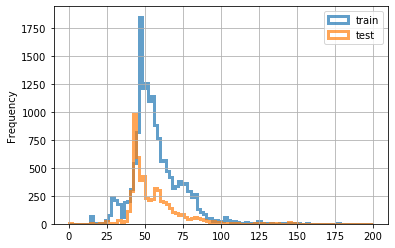

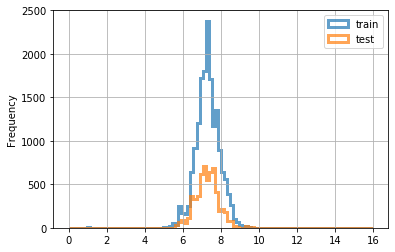

In [20]:
histogramm (gold_recovery_train, gold_recovery_test, 'rougher.input.feed_size', 100, 0, 200)
histogramm (gold_recovery_train, gold_recovery_test, 'primary_cleaner.input.feed_size', 100, 0, 16)

Визуально мы можем понять, что распределения размеров гранул на обучающей и тестовой выборках достаточно близки как на этапе флотации, так и после первой очистки: можно с большей уверенностью предполагать, что на оценку модели данный фактор значительно не повлияет.

Поскольку у нас имеются также две совокупности, у которых необходимо можно их средние, изпользуем метод scipy.stats.ttest_ind для проверки гипотезы о равенстве средних двух генеральных совокупностей. Параметр equal_var установим равным True, т.к. выборки взяты по схожим параметрам:

Для начала сформулируем нулевую гипотезу:  
$H_0$: "Средний размер гранул в обучающей и тестовой выборках равны"  
Сформулируем альтернативную гипотезу:  
$H_1$: "Средний размер гранул в обучающей и тестовой выборках не равны"  


In [21]:
# Для этапа флотации:
alpha = 0.01

results = st.ttest_ind(gold_recovery_train['rougher.input.feed_size'], 
                       gold_recovery_test['rougher.input.feed_size'], equal_var = True)
print('p-значение:', results.pvalue)

if (results.pvalue < alpha):
    print("Отвергаем нулевую гипотезу")
else:
    print("Не получилось отвергнуть нулевую гипотезу")

p-значение: 7.63075072511601e-23
Отвергаем нулевую гипотезу


In [22]:
# Для этапа первичной очистки:
alpha = 0.01

results = st.ttest_ind(gold_recovery_train['primary_cleaner.input.feed_size'], 
                       gold_recovery_test['primary_cleaner.input.feed_size'], equal_var = True)
print('p-значение: {:.7f}'.format(results.pvalue))

if (results.pvalue < alpha):
    print("Отвергаем нулевую гипотезу")
else:
    print("Не получилось отвергнуть нулевую гипотезу")

p-значение: 0.0004917
Отвергаем нулевую гипотезу


Проверка гипотезы показывает, что с достаточно высокой долей вероятности средний размер гранулы в тестовой выборке и обучающей неодинаков.

<div class="alert alert-block alert-success">
<b>Успех:</b> В целом, нам достаточно того, что распределения визуально похожи. Из-за того, что данных много, то даже небольшое отличие детектируется механизмом проверки гипотез. Более того, в большинстве случаев распределения на треине и тесте немного различаются.
</div>

## Анализ суммарной концентрации веществ на разных стадиях технологического процесса

Исследуем суммарную концентрацию всех веществ на разных стадиях производственного процесса: в сырье, в черновом и финальном концентратах. Проверим их на наличие аномальных значений.

In [23]:
# Функция для расчета суммарной концентрации веществ
def total_stage_conc(data, columns):
    total_conc = data[columns[0]] + data[columns[1]] + \
                 data[columns[2]] +data[columns[3]]
    return total_conc

columns_feed = ['rougher.input.feed_ag', 'rougher.input.feed_pb', 
                'rougher.input.feed_sol', 'rougher.input.feed_au']

columns_rougher = ['rougher.output.concentrate_ag', 'rougher.output.concentrate_pb',
                   'rougher.output.concentrate_sol', 'rougher.output.concentrate_au']
columns_primary_cleaner = ['primary_cleaner.output.concentrate_ag', 
                           'primary_cleaner.output.concentrate_pb',
                           'primary_cleaner.output.concentrate_sol',
                           'primary_cleaner.output.concentrate_au']
columns_final = ['final.output.concentrate_ag', 'final.output.concentrate_pb',
                 'final.output.concentrate_sol', 'final.output.concentrate_au']


# Для обучающей выборки:
total_feed_train = total_stage_conc(gold_recovery_train, columns_feed) 
total_rougher_train = total_stage_conc(gold_recovery_train, columns_rougher)
total_final_train = total_stage_conc(gold_recovery_train, columns_final)  

# Для тестовой выборки:
total_feed_test = total_stage_conc(gold_recovery_full.loc[gold_recovery_test.index], columns_feed)
total_rougher_test = total_stage_conc(gold_recovery_full.loc[gold_recovery_test.index], columns_rougher) 
total_final_test = total_stage_conc(gold_recovery_full.loc[gold_recovery_test.index], columns_final)

# Для общей выборки:
#total_feed_full = total_stage_conc(gold_recovery_full, columns_feed) 
#total_rougher_full = total_stage_conc(gold_recovery_full, columns_rougher)
#total_final_full = total_stage_conc(gold_recovery_full, columns_final)  

Построим гистограмму и диаграмму размаха по полученным данным для выявления аномалий.

In [24]:
def stage_hist_boxplot(feed, rougher, final):
    fig = go.Figure()
    fig.add_trace(go.Box(y=feed, name='feed'))
    fig.add_trace(go.Box(y=feed, name='rougher'))
    fig.add_trace(go.Box(y=feed, name='final'))
    fig.show()
    hist0 = feed.plot(kind='hist', y=feed, histtype='step', bins=100, linewidth = 3, 
                    alpha=0.7, label='feed', legend=True)
    rougher.plot(kind='hist', y=rougher, histtype='step', bins=100, linewidth = 3, alpha=0.7, 
               label='rougher', ax=hist0, legend=True)
    final.plot(kind='hist', y=final, histtype='step', bins=100, linewidth = 3, alpha=0.7, 
               label='final', ax=hist0, legend=True)
    plt.show()

Для обучающей выборки:

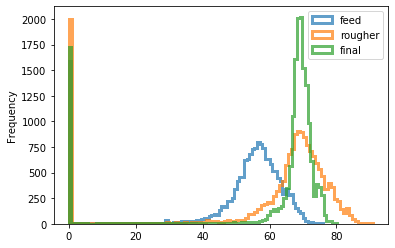

In [25]:
stage_hist_boxplot(total_feed_train, total_rougher_train, total_final_train)

Для тестовой выборки:

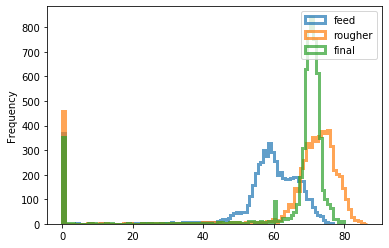

In [26]:
stage_hist_boxplot(total_feed_test, total_rougher_test, total_final_test)


Как для обучающей, так и для тестовой выборок характерны выбросы, которые располагаются вне "усов" диаграммы размаха. Однако если слишком малые и крайне большие значения концентратов веществ вполне обоснованы (вполне реально, сырье содержит как минимум полезных ископаемых, так и быть крайне наполненным ими), то полезность для анализа "нулевых" гранул - сомнительна.  
Причинами возникновения таких наблюдений могут послужить как "пустое" исходное сырье, которое потом полностью уходит в отвал, либо какой-то аппаратной ошибкой.  

Таким образом имеет смысл исключить аномалии - "нулевые" значения суммарного концентрата веществ. 

In [27]:
gold_recovery_train_good = gold_recovery_train.drop((total_feed_train[total_feed_train == 0].index) | 
                                                    (total_rougher_train[total_rougher_train == 0].index) |
                                                   (total_final_train[total_final_train == 0].index))
print(gold_recovery_train_good.shape)

(15128, 86)


In [28]:
gold_recovery_test_good = gold_recovery_test.drop((total_feed_test[total_feed_test == 0].index) | 
                                                    (total_rougher_test[total_rougher_test == 0].index) |
                                                   (total_final_test[total_final_test == 0].index))
print(gold_recovery_test_good.shape)

(5294, 52)


**Вывод:**  


Мы провели общий статистический анализ входных данных и избавились от аномалий. Теперь выделим набор обучающих и целевых признаков и выберем наиболее оптимальную модель.

# Построение модели

## Подготовка признаков обучающей и тестовой выборок

Подготовим признаки для решения последующих задач. Поскольку в п.1.2 мы пришли к выводу, что в тестовой выборке отсутствуют те показатели, которые выводятся из предшествующих и отсутствуют на начальном этапе. 

Учитывая это, будет целесообразно избавиться от таких признаков в обучающей выборке и привести их количество к количеству признаков в тестовой выборке.  

После этого, проверим показатели на мультиколлинеарность - это даст нам возможность избавиться от дополнительных признаков, которые могут негативно повлиять на результаты предсказаний.

Целевые признаки тестовой выборки возьмем из полното датасета по соответствующим индексам.

In [29]:
# Обучающая выборка:
features_train_raw = gold_recovery_train_good.loc[:, gold_recovery_test_good.columns]
target_train_rougher = gold_recovery_train_good['rougher.output.recovery']
target_train_final = gold_recovery_train_good['final.output.recovery']
print(features_train_raw.shape, target_train_rougher.shape, target_train_final.shape)

# Тестовая выборка
features_test_raw = gold_recovery_test_good
target_test_rougher = gold_recovery_full.loc[gold_recovery_test_good.index, 
                                             'rougher.output.recovery']
target_test_final = gold_recovery_full.loc[gold_recovery_test_good.index, 
                                           'final.output.recovery']

print(features_test_raw.shape, target_test_rougher.shape, target_test_final.shape)

(15128, 52) (15128,) (15128,)
(5294, 52) (5294,) (5294,)


gold_recovery_full



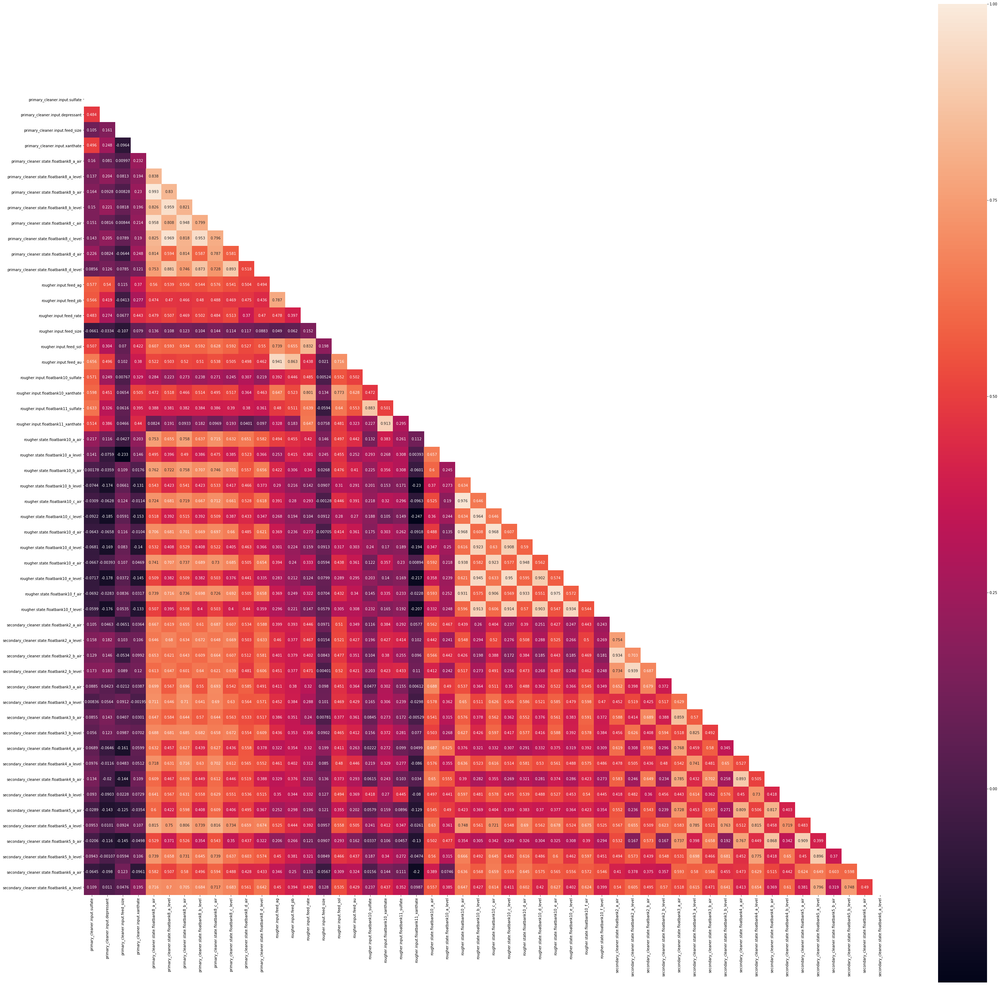

In [30]:
# Выведем матрицу корреляции для каждого датафрейма, предварительно создав соответствующую 
# функцию, исключив столбцы с качественными переменными:

def corr_matrix(name, data):
    print(name)
    print()
    matrix = np.triu(data.corr())
    plt.figure(figsize=(50,50))
    sns.heatmap(data.corr(), annot=True, mask=matrix, fmt='.3g', square=True)
    plt.show()

corr_matrix('gold_recovery_full', gold_recovery_full.loc[:, gold_recovery_test_good.columns])

На матрице корреляции видно, что зачастую имеется тесная связь между схожими показателями в одинаковых флотационных установках. 
Также высока связь между концентратом входного сырья по серебру и по золоту. Дабы исключить фактор мультиколлинеарности выделим те показатели, коэффициент корреляции которых >= 0.9 (крафне сильная прямая связь):
- **`primary_cleaner.state.floatbank8_a_air`**: `primary_cleaner.state.floatbank8_b_air`; `primary_cleaner.state.floatbank8_c_air`   
- **`primary_cleaner.state.floatbank8_a_level`**: `primary_cleaner.state.floatbank8_b_level`; `primary_cleaner.state.floatbank8_c_level`  
- **`rougher.input.feed_au`**: `rougher.input.feed_ag`  
- **`rougher.input.floatbank10_xanthate`**: `rougher.input.floatbank11_xanthate`  
- **`rougher.state.floatbank10_a_air`**: `rougher.state.floatbank10_b_air`, `rougher.state.floatbank10_c_air`, `rougher.state.floatbank10_d_air`, `rougher.state.floatbank10_e_air`  
- **`rougher.state.floatbank10_a_level`**: `rougher.state.floatbank10_b_level`, `rougher.state.floatbank10_c_level`, `rougher.state.floatbank10_d_level`, `rougher.state.floatbank10_e_level`  
- **`secondary_cleaner.state.floatbank2_a_air`**: `secondary_cleaner.state.floatbank2_b_air`  
- **`secondary_cleaner.state.floatbank2_a_level`**: `secondary_cleaner.state.floatbank2_b_level`  
- **`secondary_cleaner.state.floatbank5_a_air`**: `secondary_cleaner.state.floatbank5_b_air`  

Уберем их из тестовой и обучающей выборок

In [31]:
dropped_columns = ['primary_cleaner.state.floatbank8_b_air', 'primary_cleaner.state.floatbank8_c_air', 
                  'primary_cleaner.state.floatbank8_b_level', 'primary_cleaner.state.floatbank8_c_level', 
                  'rougher.input.feed_ag', 'rougher.input.floatbank11_xanthate', 'rougher.state.floatbank10_b_air', 
                  'rougher.state.floatbank10_c_air', 'rougher.state.floatbank10_d_air', 'rougher.state.floatbank10_e_air', 
                  'rougher.state.floatbank10_b_level', 'rougher.state.floatbank10_c_level', 'rougher.state.floatbank10_d_level', 
                  'rougher.state.floatbank10_e_level', 'secondary_cleaner.state.floatbank2_b_air', 
                   'secondary_cleaner.state.floatbank2_b_level', 'secondary_cleaner.state.floatbank5_b_air']

features_train = features_train_raw.drop(dropped_columns, axis=1)
features_test = features_test_raw.drop(dropped_columns, axis=1)
print(features_train.shape, features_test.shape)

(15128, 35) (5294, 35)


In [32]:
# Стандартизируем признаки
scaler=StandardScaler()
scaler.fit(features_train)
features_train = pd.DataFrame(scaler.transform(features_train))
features_test = pd.DataFrame(scaler.transform(features_test))

#Объединим целевые признаки в один df
target_train = pd.concat([target_train_rougher, target_train_final], axis=1)
target_test = pd.concat([target_test_rougher, target_test_final], axis=1)

# Сбросим индексы и переведем формат в np.array для дальнейших расчетов
target_train.reset_index(drop=True).head()
target_test.reset_index(drop=True).head()

target_train = np.array(target_train)
features_train = np.array(features_train)
target_test = np.array(target_test)
features_test = np.array(features_test)

## Расчет итогового sMAPE

Для расчета итогового sMAPE, воспользуемся представленными формулами:  
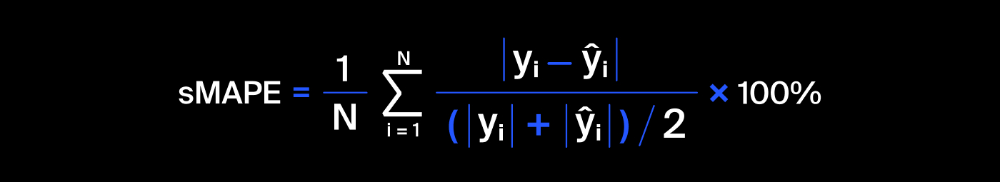
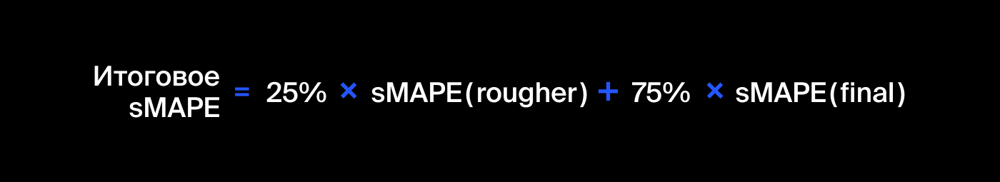

In [33]:
# Функция рассчета итогового sMAPE:
def smape(target, prediction):
    rougher = (pd.Series(
        np.abs(target[:, 0] - prediction[:,0]) / 
        ((np.abs(target[:, 0]) + np.abs(prediction[:,0]))/2)).sum() * 100 / len(target)
              )
    final = (pd.Series(
        np.abs(target[:, 1] - prediction[:, 1]) / 
        ((np.abs(target[:, 1]) + np.abs(prediction[:, 1]))/2)).sum() * 100 / len(target)
            )
    total = 0.25 * rougher + 0.75 * final
    return total

Данная функция принимает на вход массив значений целевых признаков и их предсказаний. Используем ее позднее при составлении метрики, которую передадим в `GrindSearchCV()`.

## Обучение моделей и нахождение оптимального sMAPE

In [34]:
# Зададим параметры, которые будут использованы во всех моделях:
r=42 #random_state
score = make_scorer(smape, greater_is_better=False) # расчет метрики sMAPE

Нам требуется найти модель с наилучшим значением данной метрики. Чем меньше значение показателя - тем меньше ошибка, и соответственно, тем качественнее модель. 

С помощью `GreedSearchCV()` найдем оптимальные гиперпараметры для каждой из моделей:

### DecisionTreeRegressor

Рассмотрим модель дерева решений. Установим границы параметров для определения наилучшего результата

In [35]:
model_tree = DecisionTreeRegressor(random_state=r)

greed_params_tree = {'max_depth': range(1, 21),
                     'min_samples_split': range(2, 10)}
                
# Создаём GridSearch для модели
tree_gs = GridSearchCV(model_tree, param_grid=greed_params_tree, scoring=score, cv=5, verbose=3)        

In [36]:
%%time
#CPU times: user 5min 52s, sys: 696 ms, total: 5min 53s
# Обучим модель
tree_gs.fit(features_train, target_train)

Fitting 5 folds for each of 160 candidates, totalling 800 fits
[CV] max_depth=1, min_samples_split=2 ................................
[CV] .. max_depth=1, min_samples_split=2, score=-11.475, total=   0.1s
[CV] max_depth=1, min_samples_split=2 ................................
[CV] ... max_depth=1, min_samples_split=2, score=-9.116, total=   0.1s
[CV] max_depth=1, min_samples_split=2 ................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s remaining:    0.0s


[CV] ... max_depth=1, min_samples_split=2, score=-9.640, total=   0.1s
[CV] max_depth=1, min_samples_split=2 ................................
[CV] .. max_depth=1, min_samples_split=2, score=-11.002, total=   0.1s
[CV] max_depth=1, min_samples_split=2 ................................
[CV] .. max_depth=1, min_samples_split=2, score=-13.643, total=   0.1s
[CV] max_depth=1, min_samples_split=3 ................................
[CV] .. max_depth=1, min_samples_split=3, score=-11.475, total=   0.1s
[CV] max_depth=1, min_samples_split=3 ................................
[CV] ... max_depth=1, min_samples_split=3, score=-9.116, total=   0.1s
[CV] max_depth=1, min_samples_split=3 ................................
[CV] ... max_depth=1, min_samples_split=3, score=-9.640, total=   0.1s
[CV] max_depth=1, min_samples_split=3 ................................
[CV] .. max_depth=1, min_samples_split=3, score=-11.002, total=   0.1s
[CV] max_depth=1, min_samples_split=3 ................................
[CV] .

[Parallel(n_jobs=1)]: Done 800 out of 800 | elapsed:  7.0min finished


CPU times: user 6min 42s, sys: 463 ms, total: 6min 43s
Wall time: 6min 59s


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=DecisionTreeRegressor(criterion='mse', max_depth=None,
                                             max_features=None,
                                             max_leaf_nodes=None,
                                             min_impurity_decrease=0.0,
                                             min_impurity_split=None,
                                             min_samples_leaf=1,
                                             min_samples_split=2,
                                             min_weight_fraction_leaf=0.0,
                                             presort=False, random_state=42,
                                             splitter='best'),
             iid='warn', n_jobs=None,
             param_grid={'max_depth': range(1, 21),
                         'min_samples_split': range(2, 10)},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=make

In [37]:
print('Лучшая модель дерева решений:')
print(tree_gs.best_estimator_)
print('Лучшее значение итогового sMAPE: {:.4f}'.format(tree_gs.best_score_))

Лучшая модель дерева решений:
DecisionTreeRegressor(criterion='mse', max_depth=6, max_features=None,
                      max_leaf_nodes=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=7, min_weight_fraction_leaf=0.0,
                      presort=False, random_state=42, splitter='best')
Лучшее значение итогового sMAPE: -10.9415


Предскажем значения целевого показателя на тестовой выборке:

In [38]:
predictions = tree_gs.predict(features_test)

smape_total = smape(target_test, predictions)
print('Лучшее значение итогового sMAPE тестовой выборки для дерева решений: {:.4f}'.format(smape_total))

Лучшее значение итогового sMAPE тестовой выборки для дерева решений: 11.1896


### Линейная регрессия

In [39]:
model_linear = LinearRegression()
greed_params_linear = {'normalize': [True, False]}
# Создаём GridSearch для модели
linear_gs = GridSearchCV(model_linear, param_grid=greed_params_linear, 
                         scoring=score, cv=5, verbose=3)    

In [40]:
linear_gs.fit(features_train, target_train) 

Fitting 5 folds for each of 2 candidates, totalling 10 fits
[CV] normalize=True ..................................................
[CV] .................... normalize=True, score=-12.420, total=   0.2s
[CV] normalize=True ..................................................
[CV] ..................... normalize=True, score=-8.943, total=   0.0s
[CV] normalize=True ..................................................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.2s remaining:    0.0s


[CV] ..................... normalize=True, score=-8.713, total=   0.2s
[CV] normalize=True ..................................................
[CV] .................... normalize=True, score=-11.392, total=   0.1s
[CV] normalize=True ..................................................
[CV] .................... normalize=True, score=-16.537, total=   0.3s
[CV] normalize=False .................................................
[CV] ................... normalize=False, score=-12.420, total=   0.3s
[CV] normalize=False .................................................
[CV] .................... normalize=False, score=-8.943, total=   0.3s
[CV] normalize=False .................................................
[CV] .................... normalize=False, score=-8.713, total=   0.1s
[CV] normalize=False .................................................
[CV] ................... normalize=False, score=-11.392, total=   0.1s
[CV] normalize=False .................................................
[CV] .

[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    2.0s finished


GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=LinearRegression(copy_X=True, fit_intercept=True,
                                        n_jobs=None, normalize=False),
             iid='warn', n_jobs=None, param_grid={'normalize': [True, False]},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=make_scorer(smape, greater_is_better=False), verbose=3)

In [41]:
print('Лучшая модель линейной регрессии:')
print(linear_gs.best_estimator_)
print('Лучшее значение итогового sMAPE: {:.4f}'.format(linear_gs.best_score_))

Лучшая модель линейной регрессии:
LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=True)
Лучшее значение итогового sMAPE: -11.6007


In [42]:
predictions = linear_gs.predict(features_test)

smape_total = smape(target_test, predictions)
print('Лучшее значение итогового sMAPE тестовой выборки для линейной регрессии: {:.4f}'.format(smape_total))

Лучшее значение итогового sMAPE тестовой выборки для линейной регрессии: 7.4523


### Случайный лес

In [43]:
model_forest = RandomForestRegressor(random_state=r)

greed_params_forest = {'n_estimators': range(1, 51, 5),
                     'max_depth': range(1, 21),
                     'min_samples_split': range(2, 10)}
                
# Создаём GridSearch для модели
forest_gs = GridSearchCV(model_forest, param_grid=greed_params_forest, 
                         scoring=score, cv=5, verbose=3)        

**Внимание, долгий расчет**

In [ ]:
%%time
#CPU times: user 13h 4min 10s, sys: 19 s, total: 13h 4min 29s
#Wall time: 13h 15min 17s
# Обучим модель
forest_gs.fit(features_train, target_train)

Fitting 5 folds for each of 1600 candidates, totalling 8000 fits
[CV] max_depth=1, min_samples_split=2, n_estimators=1 ................
[CV]  max_depth=1, min_samples_split=2, n_estimators=1, score=-11.506, total=   0.0s
[CV] max_depth=1, min_samples_split=2, n_estimators=1 ................
[CV]  max_depth=1, min_samples_split=2, n_estimators=1, score=-9.090, total=   0.1s
[CV] max_depth=1, min_samples_split=2, n_estimators=1 ................
[CV]  max_depth=1, min_samples_split=2, n_estimators=1, score=-9.670, total=   0.0s
[CV] max_depth=1, min_samples_split=2, n_estimators=1 ................


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s


[CV]  max_depth=1, min_samples_split=2, n_estimators=1, score=-10.939, total=   0.1s
[CV] max_depth=1, min_samples_split=2, n_estimators=1 ................
[CV]  max_depth=1, min_samples_split=2, n_estimators=1, score=-13.580, total=   0.0s
[CV] max_depth=1, min_samples_split=2, n_estimators=6 ................
[CV]  max_depth=1, min_samples_split=2, n_estimators=6, score=-11.518, total=   0.3s
[CV] max_depth=1, min_samples_split=2, n_estimators=6 ................
[CV]  max_depth=1, min_samples_split=2, n_estimators=6, score=-9.106, total=   0.2s
[CV] max_depth=1, min_samples_split=2, n_estimators=6 ................
[CV]  max_depth=1, min_samples_split=2, n_estimators=6, score=-9.657, total=   0.3s
[CV] max_depth=1, min_samples_split=2, n_estimators=6 ................
[CV]  max_depth=1, min_samples_split=2, n_estimators=6, score=-10.977, total=   0.2s
[CV] max_depth=1, min_samples_split=2, n_estimators=6 ................
[CV]  max_depth=1, min_samples_split=2, n_estimators=6, score=-13.

In [ ]:
print('Лучшая модель случайного леса:')
print(forest_gs.best_estimator_)
print('Лучшее значение итогового sMAPE: {:.4f}'.format(forest_gs.best_score_))

In [ ]:
#RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=9,
#                      max_features='auto', max_leaf_nodes=None,
#                      min_impurity_decrease=0.0, min_impurity_split=None,
#                      min_samples_leaf=1, min_samples_split=4,
#                      min_weight_fraction_leaf=0.0, n_estimators=46,
#                      n_jobs=None, oob_score=False, random_state=42, verbose=0,
#                      warm_start=False)
#Лучшее значение итогового sMAPE: -10.2221

In [ ]:
predictions = forest_gs.predict(features_test)

smape_total = smape(target_test, predictions)
print('Лучшее значение итогового sMAPE тестовой выборки для случайного леса: {:.4f}'.format(smape_total))

**Вывод:**  
По итогам проведенного исследования, мы выявили наилучшую модель:  

RandomForestRegressor  
(bootstrap=True, criterion='mse', max_depth=9,                       max_features='auto', max_leaf_nodes=None,  
                      min_impurity_decrease=0.0, min_impurity_split=None,  
                      min_samples_leaf=1, min_samples_split=4,  
                      min_weight_fraction_leaf=0.0, n_estimators=46,  
                      n_jobs=None, oob_score=False, random_state=42, verbose=0,  
                      warm_start=False)  

Итоговое sMAPE: 8.0415